In [1]:
%matplotlib inline

# 1) Wipe out your namespace
%reset -f

# 2) Clear Jupyter’s stored outputs (and inputs if you like)
try:
    Out.clear() 
except NameError:
    pass

try:
    In.clear()
except NameError:
    pass

# 3) Force Python GC
import gc
gc.collect()

# 4) Free any GPU buffers
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# 5) remove checkpoints
# import os; _ = [os.remove(p) for p in __import__("glob").glob("libs/.ipynb_checkpoints/*.py") if os.path.exists(p)]


import importlib
from libs import trades, plots, params, feats, strategies
importlib.reload(trades)
importlib.reload(plots)
importlib.reload(params)
importlib.reload(feats)
importlib.reload(strategies)

<module 'libs.strategies' from '/workspace/my_models/Trading/_Stock_Analysis_/libs/strategies.py'>

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns

import glob
import json
import re
import os
import psutil

import time
import datetime as dt
from tqdm.auto import tqdm
from IPython.display import clear_output, display

,open,high,low,close,volume,signal,ret,log_ret,sma_9,sma_21,sma_pct_9,sma_pct_21,ema_9,ema_21,roc_9,roc_21,body,body_pct,upper_shad,lower_shad,range_pct,rsi_6,macd_line,macd_signal,macd_diff,atr_14,atr_pct_14,bb_lband_20,bb_hband_20,bb_w_20,plus_di,minus_di,adx,obv,vwap_14,vwap_dev_pct_14,vol_spike,vol_z_14,rolling_max_close_21,rolling_min_close_21,dist_high_21,dist_low_21,obv_sma,obv_diff_14,obv_pct_14,obv_sma_14,obv_z_14,ret_30,sma_30,sma_pct_30,ema_30,roc_30,rsi_30,atr_30,atr_pct_30,bb_lband_30,bb_hband_30,bb_w_30,plus_di_30,minus_di_30,adx_30,obv_diff_30,obv_pct_30,obv_sma_30,obv_z_30,vwap_30,vwap_dev_pct_30,z_vwap_dev_30,vol_spike_30,vol_z_30,ret_std_30,rolling_max_close_30,rolling_min_close_30,dist_high_30,dist_low_30,macd_line_30,macd_signal_30,macd_diff_30,ret_45,sma_45,sma_pct_45,ema_45,roc_45,rsi_45,atr_45,atr_pct_45,bb_lband_45,bb_hband_45,bb_w_45,plus_di_45,minus_di_45,adx_45,obv_diff_45,obv_pct_45,obv_sma_45,obv_z_45,vwap_45,vwap_dev_pct_45,z_vwap_dev_45,vol_spike_45,vol_z_45,ret_std_45,rolling_max_close_45,rolling_min_close_45,dist_high_45,dist_low_45,macd_line_45,macd_signal_45,macd_diff_45,ret_60,sma_60,sma_pct_60,ema_60,roc_60,rsi_60,atr_60,atr_pct_60,bb_lband_60,bb_hband_60,bb_w_60,plus_di_60,minus_di_60,adx_60,obv_diff_60,obv_pct_60,obv_sma_60,obv_z_60,vwap_60,vwap_dev_pct_60,z_vwap_dev_60,vol_spike_60,vol_z_60,ret_std_60,rolling_max_close_60,rolling_min_close_60,dist_high_60,dist_low_60,macd_line_60,macd_signal_60,macd_diff_60,volume_z_30,vol_spike_z_30,ret_std_z_30,obv_pct_z_30,vwap_dev_pct_z_30,bb_w_z_30,atr_z_30,macd_diff_z_30,volume_z_45,vol_spike_z_45,ret_std_z_45,obv_pct_z_45,vwap_dev_pct_z_45,bb_w_z_45,atr_z_45,macd_diff_z_45,volume_z_60,vol_spike_z_60,ret_std_z_60,obv_pct_z_60,vwap_dev_pct_z_60,bb_w_z_60,atr_z_60,macd_diff_z_60,minute_time,hour_time,dow_time,month_time,day_of_year_time,week_of_year_time,in_sess_time,eng_ma,eng_macd,eng_bb,eng_bb_mid,eng_rsi,eng_adx,eng_obv,eng_atr_div,z_eng_atr,eng_sma_short,eng_sma_long,eng_vwap,z_vwap_dev,z_bb_w,z_obv,mom_sum_30,mom_std_30,mom_sum_45,mom_std_45,mom_sum_60,mom_std_60,eng_ema_cross_up,eng_ema_cross_down,ask,bid,rsi_min_thresh,rsi_max_thresh
2022-12-23 10:58:00,132.506667,132.506667,132.506667,132.506667,3.766667e+02,0.068838,-0.000025,-0.000025,132.517407,132.463651,-0.000081,0.000325,132.501714,132.450580,0.000126,0.000428,0.000,0.000000,0.000,0.000,0.000000,55.324571,0.066914,0.076274,-0.009361,0.030896,0.000233,132.351547,132.577120,0.001703,53.329334,22.545811,52.004170,4.810433e+04,132.024282,0.365375,0.462019,-0.911671,132.540,132.36,0.000252,0.001107,4.767483e+04,4.656333e+03,35.146275,4.767483e+04,0.269138,0.002547,132.419889,0.000655,132.403860,0.002547,67.514546,0.034648,0.000261,132.220285,132.619493,0.003015,49.033670,19.075239,40.643327,1.196033e+04,90.321276,4.478294e+04,0.370286,132.417943,0.067003,-1.435313,0.424020,-0.936193,0.000271,132.540,132.20,0.000252,0.002314,0.084061,0.080324,0.003737,0.003663,132.310329,0.001484,132.330747,0.003663,67.477198,0.037214,0.000281,131.957731,132.662926,0.005330,45.383192,19.249055,28.521447,2.131996e+04,161.136009,4.104582e+04,0.244755,132.288077,0.165238,-0.378640,0.394909,-1.100015,0.000230,132.540,132.028750,0.000252,0.003607,0.072126,0.069040,0.003086,0.004638,132.228319,0.002105,132.270541,0.004638,66.814987,0.038612,0.000291,131.810366,132.646273,0.006322,43.207120,20.127475,0.000000,4.737383e+04,358.272975,3.439157e+04,0.345499,132.165188,0.258373,0.724499,0.327654,-1.358106,0.000201,132.540,131.922500,0.000252,0.004409,0.063599,0.059554,0.004045,-0.467325,-0.000002,0.190732,-0.326255,-0.796174,-0.714829,-2.471902,-20.000000,-0.677505,-0.000002,20.000000,-20.000000,-20.000000,20.000000,-1.096288,0.000000,-0.861826,-1.606155e-11,0.000000,0.000000,20.000000,20.000000,-0.187204,0.000000,0.352778,0.312500,0.071429,0.416667,0.475342,0.461538,0.0,0.000406,-0.000071,0.00000,-0.000319,0.000000,0.098520,0.099620,-0.242750,-1.828533,0.000081,-0.000325,-99.724259,-0.805629,0.201443,-0.950054,0.08705

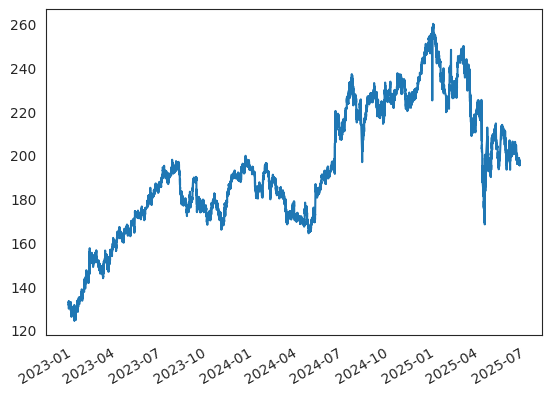

In [3]:
# Read the unscaled indicators dataframe (only the test part)

df_inds_test = pd.read_csv(params.indunsc_test_csv, index_col=0, parse_dates=True) # indunsc_test_csv
# df_inds_test = df_inds_test[(df_inds_test.index >= '2023-06-20') & (df_inds_test.index < '2024-05-10')] #########################

# compute synthetic ask/bid from close_raw and configured spread
df_inds_test['ask'] = df_inds_test['close'] * (1 + params.bidask_spread_pct/100)
df_inds_test['bid'] = df_inds_test['close'] * (1 - params.bidask_spread_pct/100)
df_inds_test['rsi_min_thresh'] = params.rsi_min_thresh_tick
df_inds_test['rsi_max_thresh'] = params.rsi_max_thresh_tick

df_inds_test.close.plot()
df_inds_test

In [4]:
# importlib.reload(params) #####
# importlib.reload(strategies) #####

first_day = df_inds_test.index.normalize().min()
start_ask = df_inds_test.loc[df_inds_test.index.normalize() == first_day, "ask"].iloc[0]
strategies.reset_globals(start_ask)  # reset globals and initialize buy&hold with canonical first-day ask

# df_inds_test = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check] ################################

sim_results = {}
groups = df_inds_test.groupby(df_inds_test.index.normalize())
total_days = df_inds_test.index.normalize().nunique()
col_signal = params.col_signal_tick
sign_thresh = params.sign_thresh_tick
sess_start = params.sess_start_tick

for day, df_day_sim in tqdm(groups, desc="Generate+Simulate", total=total_days):
    
    df_actions = strategies.generate_actions_slope(
        df              = df_day_sim,
        col_signal      = col_signal,
        sign_thresh     = sign_thresh,
        col_atr         = "atr_14",
        col_rsi         = "rsi_6",
        col_vwap        = "vwap_14",
        reset_peak      = params.reset_peak_tick,
        rsi_min_thresh  = params.rsi_min_thresh_tick,
        rsi_max_thresh  = params.rsi_max_thresh_tick,
        trailstop_pct   = params.trailstop_pct_tick,
        atr_mult        = params.atr_mult_tick,
        vwap_atr_mult   = params.vwap_atr_mult_tick,
        sess_start      = sess_start
    )
    
    sim_results.update(
        strategies.simulate_trading(
            day         = day,
            df          = df_actions,
            invest_frac = params.invest_frac_tick,
            buy_factor  = params.buy_factor_tick,
            sell_factor = params.sell_factor_tick,
            sess_start  = sess_start
        )
    )

print("Loop finished. Days simulated:", len(sim_results))


Generate+Simulate:   0%|          | 0/622 [00:00<?, ?it/s]

Loop finished. Days simulated: 622


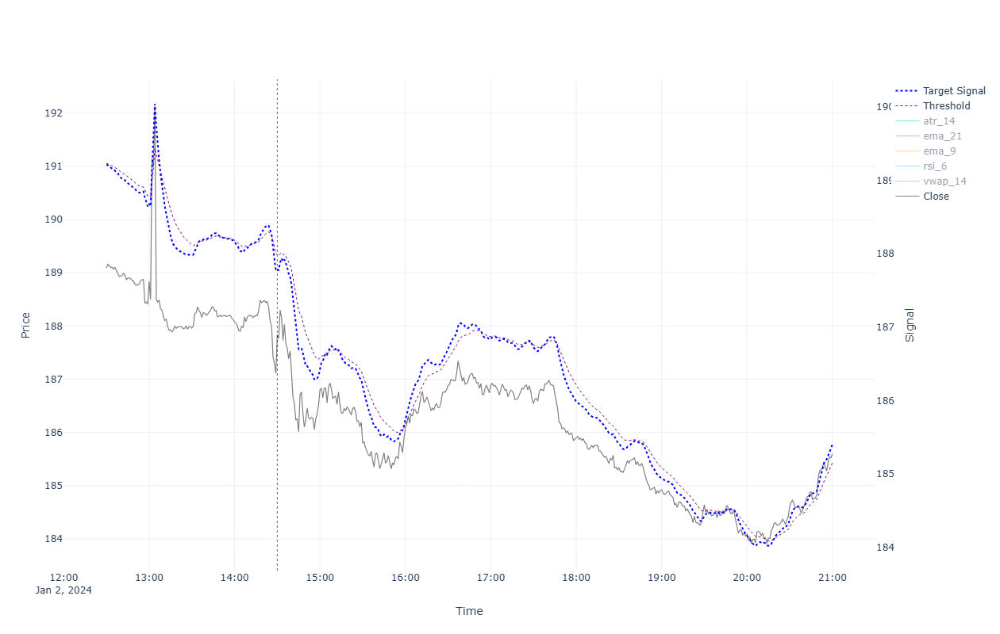


                                                  ******* Performance for 2024-01-02 *******

INTRADAY:
  shares(621); [ask_buy=187.868, fee_buy=0.004, pos_amnt_buy=116668.242]; [bid_sell=185.563, fee_sell=0.018, pos_amnt_sell=115223.21]; leftover=140.983; PNL=-1445.032
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(754); [start=187.868 end=185.563]; leftover=66.975; total_cap=139967.62; PNL=-5427.59

------------------------------------------------------------------------------------------------------------------------------------------------------



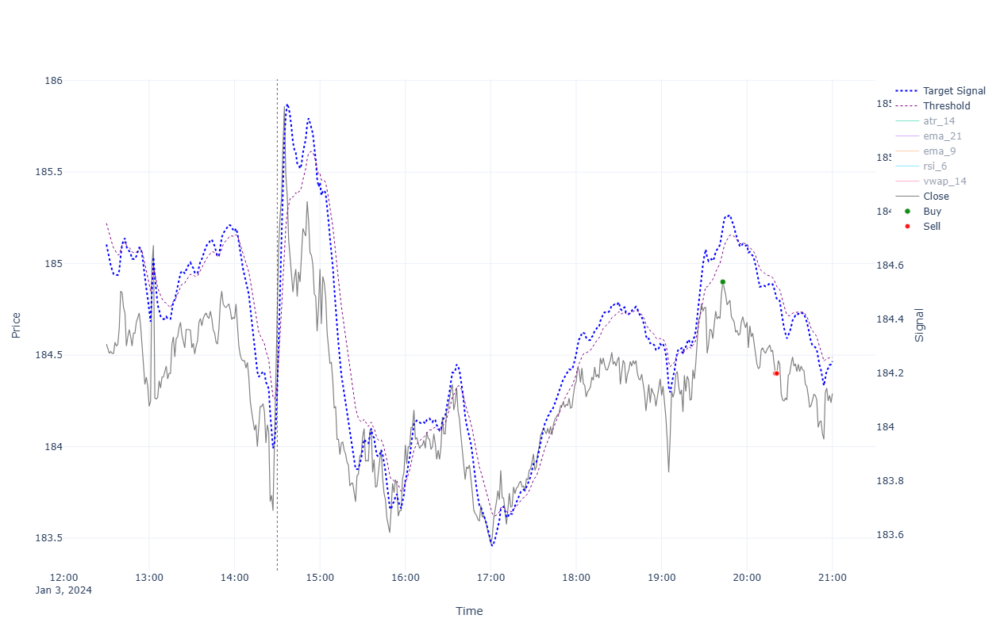


                                                  ******* Performance for 2024-01-03 *******

INTRADAY:
  shares(624); [ask_buy=184.727, fee_buy=0.004, pos_amnt_buy=115272.105]; [bid_sell=184.253, fee_sell=0.018, pos_amnt_sell=114962.586]; leftover=92.088; PNL=-309.519
TRADES:
  Tr[1]: Time(19:43)Ask(184.937)Bid(184.863)Act(Buy)Shrs(5)Pos(5); CashTr(-924.705)=Cost(-924.685)-Fee(-0.02); P&L(111168.611)=CashTot(110244.295)+PosAmt(924.315)
  Tr[2]: Time(20:20)Ask(184.437)Bid(184.363)Act(Sell)Shrs(3)Pos(2); CashTr(553.035)=Cost(553.089)-Fee(-0.055); P&L(111166.056)=CashTot(110797.33)+PosAmt(368.726)
  Tr[3]: Time(20:21)Ask(184.437)Bid(184.363)Act(Sell)Shrs(2)Pos(0); CashTr(368.69)=Cost(368.726)-Fee(-0.036); P&L(111166.02)=CashTot(111166.02)+PosAmt(0.0)
STRATEGY:
  Δ[1]:-0.39 + Δ[2]:-2.554 + Δ[3]:-0.036 PNL=-2.98
BUYNHOLD:
  shares(754); [start=184.727 end=184.253]; leftover=66.975; total_cap=138980.1; PNL=-987.52

---------------------------------------------------------------------------

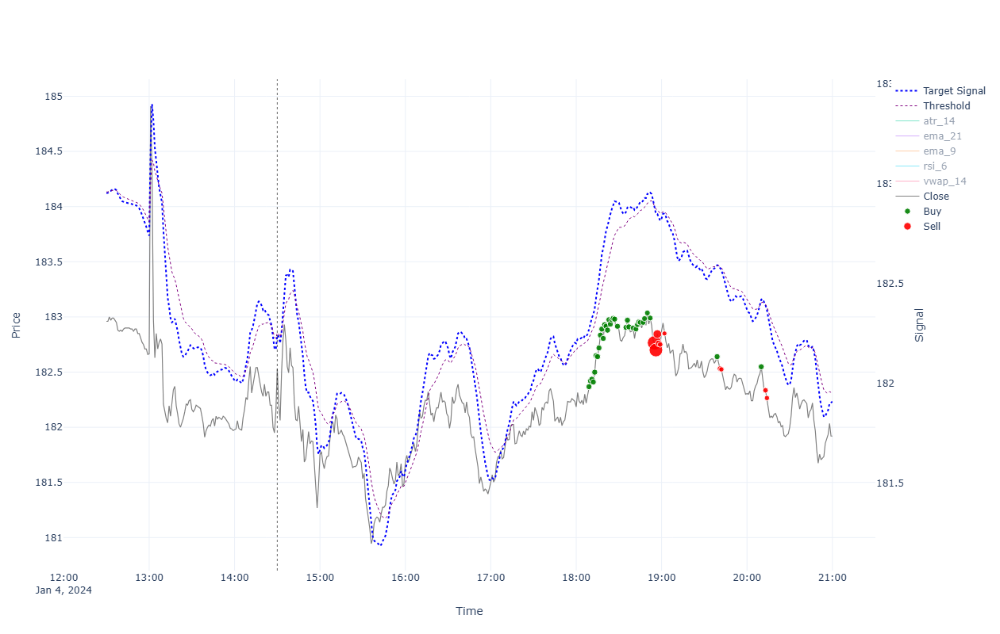


                                                  ******* Performance for 2024-01-04 *******

INTRADAY:
  shares(630); [ask_buy=182.567, fee_buy=0.004, pos_amnt_buy=115019.419]; [bid_sell=181.884, fee_sell=0.018, pos_amnt_sell=114575.228]; leftover=35.255; PNL=-444.19
TRADES:
  Tr[1]: Time(18:09)Ask(182.404)Bid(182.331)Act(Buy)Shrs(5)Pos(5); CashTr(-912.041)=Cost(-912.021)-Fee(-0.02); P&L(111165.635)=CashTot(110253.979)+PosAmt(911.656)
  Tr[2]: Time(18:10)Ask(182.456)Bid(182.383)Act(Buy)Shrs(5)Pos(10); CashTr(-912.302)=Cost(-912.282)-Fee(-0.02); P&L(111165.511)=CashTot(109341.677)+PosAmt(1823.834)
  Tr[3]: Time(18:11)Ask(182.471)Bid(182.399)Act(Buy)Shrs(5)Pos(15); CashTr(-912.377)=Cost(-912.357)-Fee(-0.02); P&L(111165.277)=CashTot(108429.3)+PosAmt(2735.978)
  Tr[4]: Time(18:12)Ask(182.446)Bid(182.374)Act(Buy)Shrs(5)Pos(20); CashTr(-912.252)=Cost(-912.232)-Fee(-0.02); P&L(111164.518)=CashTot(107517.047)+PosAmt(3647.47)
  Tr[5]: Time(18:13)Ask(182.536)Bid(182.463)Act(Buy)Shrs(5)Pos(25);

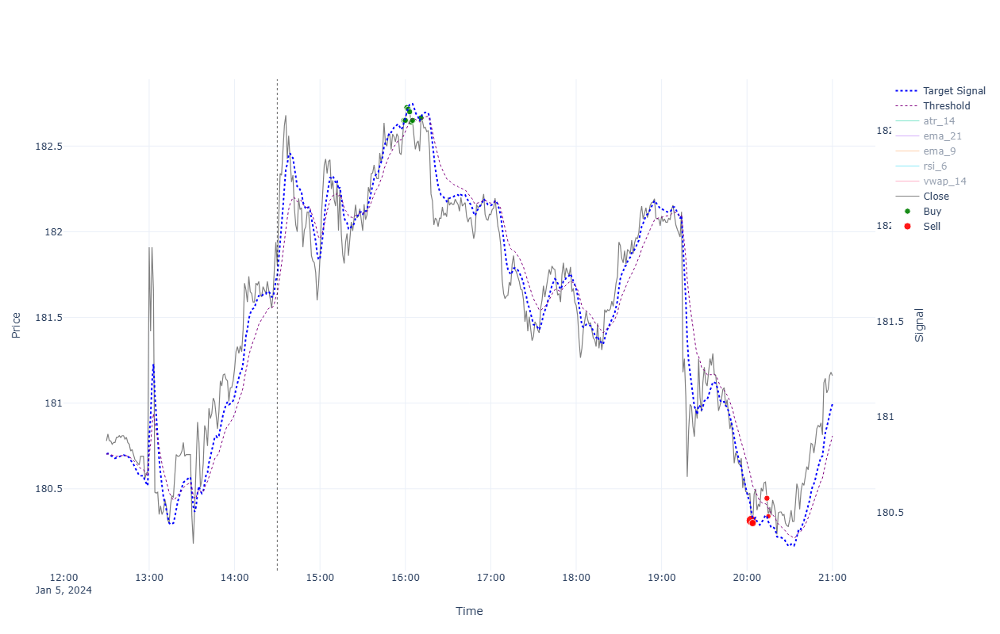


                                                  ******* Performance for 2024-01-05 *******

INTRADAY:
  shares(630); [ask_buy=181.846, fee_buy=0.004, pos_amnt_buy=114565.476]; [bid_sell=181.124, fee_sell=0.018, pos_amnt_sell=114096.535]; leftover=45.007; PNL=-468.941
TRADES:
  Tr[1]: Time(15:59)Ask(182.687)Bid(182.613)Act(Buy)Shrs(5)Pos(5); CashTr(-913.453)=Cost(-913.433)-Fee(-0.02); P&L(111138.842)=CashTot(110225.774)+PosAmt(913.067)
  Tr[2]: Time(16:00)Ask(182.687)Bid(182.613)Act(Buy)Shrs(5)Pos(10); CashTr(-913.453)=Cost(-913.433)-Fee(-0.02); P&L(111138.457)=CashTot(109312.322)+PosAmt(1826.135)
  Tr[3]: Time(16:01)Ask(182.762)Bid(182.688)Act(Buy)Shrs(5)Pos(15); CashTr(-913.828)=Cost(-913.808)-Fee(-0.02); P&L(111138.821)=CashTot(108398.494)+PosAmt(2740.327)
  Tr[4]: Time(16:02)Ask(182.752)Bid(182.678)Act(Buy)Shrs(5)Pos(20); CashTr(-913.778)=Cost(-913.758)-Fee(-0.02); P&L(111138.286)=CashTot(107484.716)+PosAmt(3653.569)
  Tr[5]: Time(16:03)Ask(182.737)Bid(182.663)Act(Buy)Shrs(5)Pos(

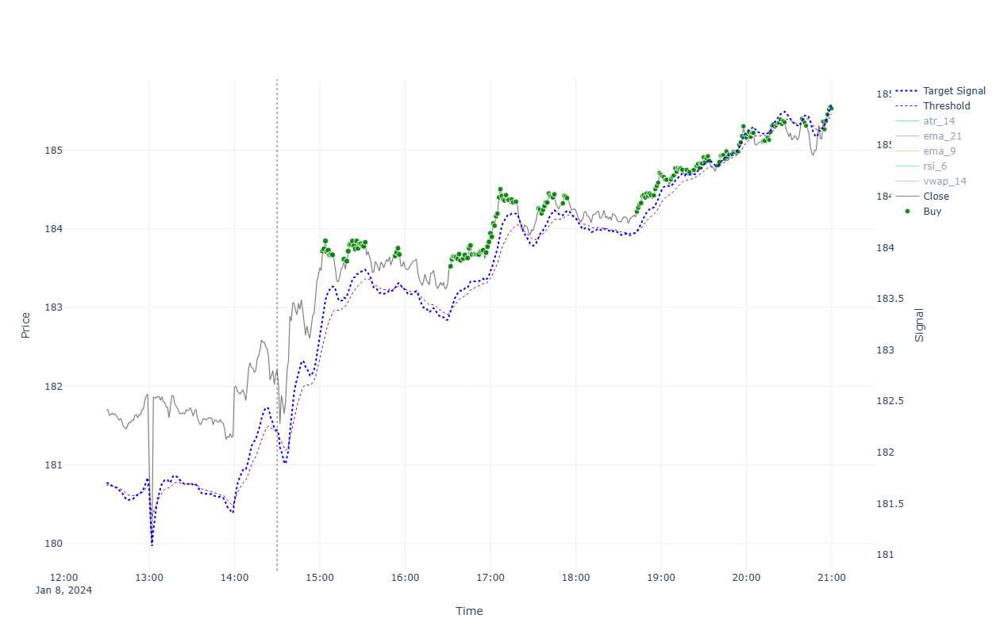


                                                  ******* Performance for 2024-01-08 *******

INTRADAY:
  shares(626); [ask_buy=182.246, fee_buy=0.004, pos_amnt_buy=114088.777]; [bid_sell=185.493, fee_sell=0.018, pos_amnt_sell=116107.123]; leftover=52.766; PNL=2018.346
TRADES:
  Tr[1]: Time(15:02)Ask(183.757)Bid(183.683)Act(Buy)Shrs(5)Pos(5); CashTr(-918.804)=Cost(-918.784)-Fee(-0.02); P&L(111041.225)=CashTot(110122.809)+PosAmt(918.416)
  Tr[2]: Time(15:03)Ask(183.782)Bid(183.708)Act(Buy)Shrs(5)Pos(10); CashTr(-918.929)=Cost(-918.909)-Fee(-0.02); P&L(111040.963)=CashTot(109203.88)+PosAmt(1837.083)
  Tr[3]: Time(15:04)Ask(183.884)Bid(183.81)Act(Buy)Shrs(5)Pos(15); CashTr(-919.439)=Cost(-919.419)-Fee(-0.02); P&L(111041.595)=CashTot(108284.441)+PosAmt(2757.153)
  Tr[4]: Time(15:05)Ask(183.747)Bid(183.673)Act(Buy)Shrs(5)Pos(20); CashTr(-918.754)=Cost(-918.734)-Fee(-0.02); P&L(111039.153)=CashTot(107365.688)+PosAmt(3673.465)
  Tr[5]: Time(15:06)Ask(183.766)Bid(183.692)Act(Buy)Shrs(5)Pos(25

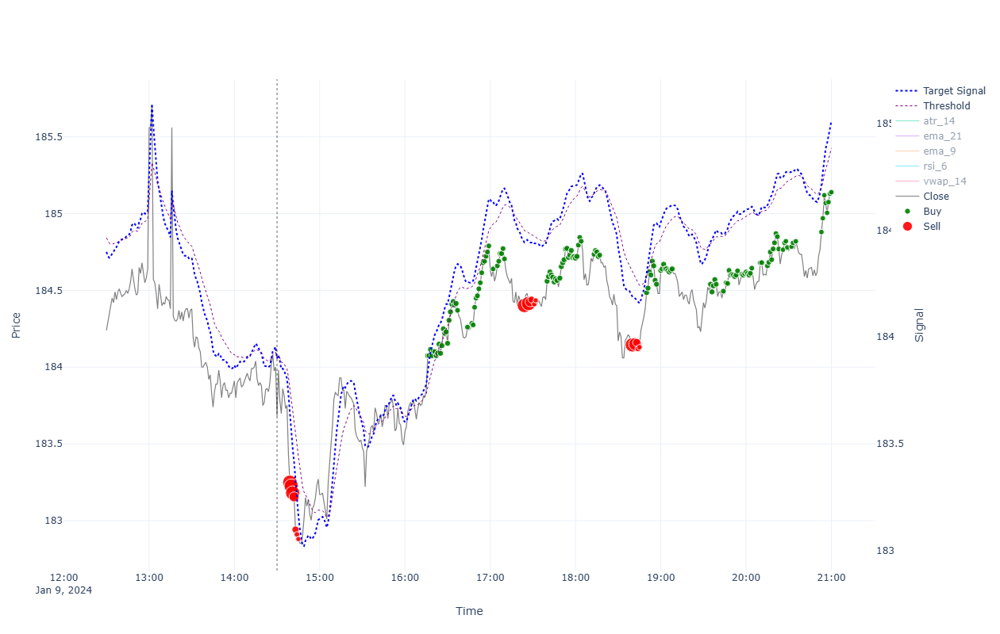


                                                  ******* Performance for 2024-01-09 *******

INTRADAY:
  shares(632); [ask_buy=183.717, fee_buy=0.004, pos_amnt_buy=116111.505]; [bid_sell=185.103, fee_sell=0.018, pos_amnt_sell=116973.546]; leftover=48.384; PNL=862.041
TRADES:
  Tr[1]: Time(14:39)Ask(183.287)Bid(183.213)Act(Sell)Shrs(288)Pos(214); CashTr(52760.202)=Cost(52765.445)-Fee(-5.243); P&L(110505.882)=CashTot(71298.225)+PosAmt(39207.657)
  Tr[2]: Time(14:40)Ask(183.262)Bid(183.188)Act(Sell)Shrs(123)Pos(91); CashTr(22529.929)=Cost(22532.168)-Fee(-2.239); P&L(110498.294)=CashTot(93828.153)+PosAmt(16670.14)
  Tr[3]: Time(14:41)Ask(183.217)Bid(183.143)Act(Sell)Shrs(53)Pos(38); CashTr(9705.634)=Cost(9706.598)-Fee(-0.965); P&L(110493.235)=CashTot(103533.787)+PosAmt(6959.448)
  Tr[4]: Time(14:42)Ask(183.192)Bid(183.118)Act(Sell)Shrs(22)Pos(16); CashTr(4028.204)=Cost(4028.604)-Fee(-0.4); P&L(110491.885)=CashTot(107561.991)+PosAmt(2929.894)
  Tr[5]: Time(14:43)Ask(182.978)Bid(182.905)Ac

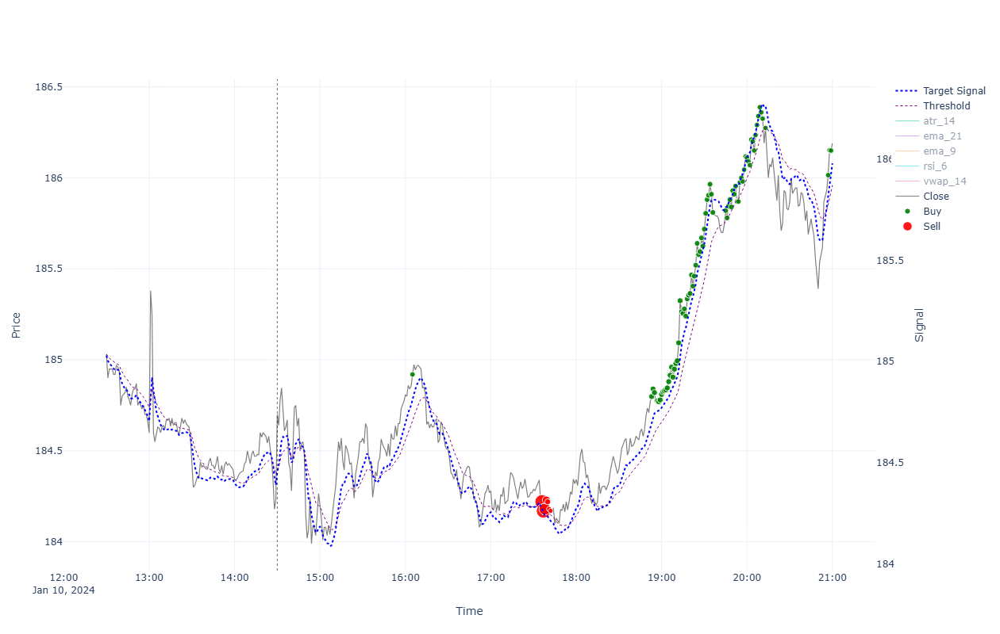


                                                  ******* Performance for 2024-01-10 *******

INTRADAY:
  shares(633); [ask_buy=184.737, fee_buy=0.004, pos_amnt_buy=116941.015]; [bid_sell=186.153, fee_sell=0.018, pos_amnt_sell=117823.132]; leftover=80.914; PNL=882.117
TRADES:
  Tr[1]: Time(16:05)Ask(184.957)Bid(184.883)Act(Buy)Shrs(3)Pos(274); CashTr(-554.882)=Cost(-554.87)-Fee(-0.012); P&L(110434.213)=CashTot(59776.322)+PosAmt(50657.892)
  Tr[2]: Time(17:36)Ask(184.257)Bid(184.183)Act(Sell)Shrs(157)Pos(117); CashTr(28913.925)=Cost(28916.787)-Fee(-2.862); P&L(110239.699)=CashTot(88690.247)+PosAmt(21549.453)
  Tr[3]: Time(17:37)Ask(184.207)Bid(184.133)Act(Sell)Shrs(67)Pos(50); CashTr(12335.701)=Cost(12336.922)-Fee(-1.221); P&L(110232.606)=CashTot(101025.948)+PosAmt(9206.658)
  Tr[4]: Time(17:38)Ask(184.217)Bid(184.143)Act(Sell)Shrs(29)Pos(21); CashTr(5339.623)=Cost(5340.152)-Fee(-0.529); P&L(110232.577)=CashTot(106365.571)+PosAmt(3867.006)
  Tr[5]: Time(17:39)Ask(184.267)Bid(184.193)Ac

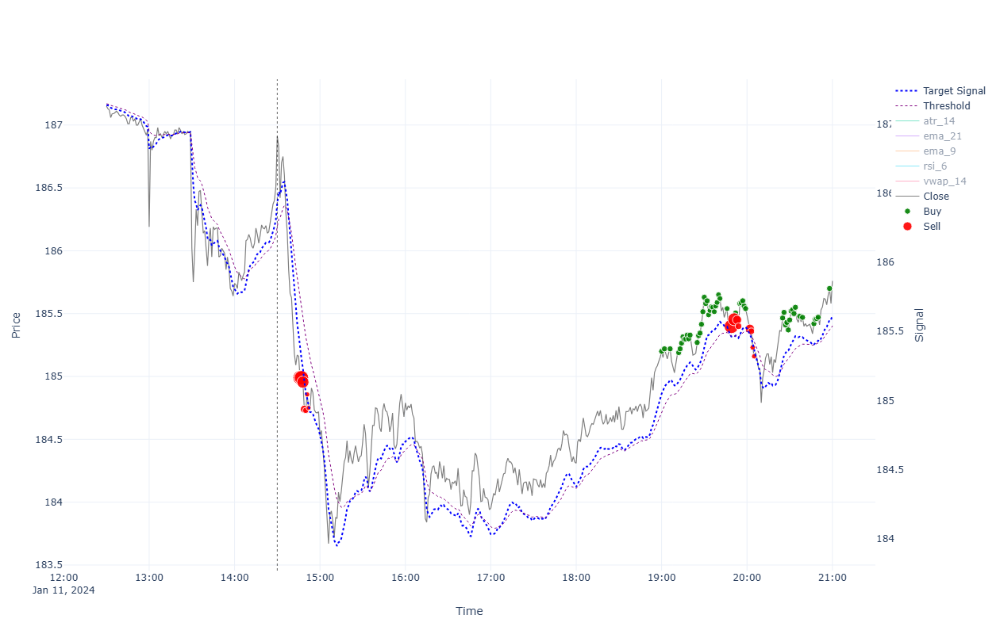


                                                  ******* Performance for 2024-01-11 *******

INTRADAY:
  shares(630); [ask_buy=186.947, fee_buy=0.004, pos_amnt_buy=117779.371]; [bid_sell=185.723, fee_sell=0.018, pos_amnt_sell=116993.889]; leftover=124.676; PNL=-785.482
TRADES:
  Tr[1]: Time(14:46)Ask(185.027)Bid(184.953)Act(Sell)Shrs(168)Pos(125); CashTr(31069.039)=Cost(31072.104)-Fee(-3.065); P&L(110055.828)=CashTot(86936.702)+PosAmt(23119.125)
  Tr[2]: Time(14:47)Ask(185.027)Bid(184.953)Act(Sell)Shrs(72)Pos(53); CashTr(13315.303)=Cost(13316.616)-Fee(-1.314); P&L(110054.514)=CashTot(100252.005)+PosAmt(9802.509)
  Tr[3]: Time(14:48)Ask(184.992)Bid(184.918)Act(Sell)Shrs(31)Pos(22); CashTr(5731.893)=Cost(5732.458)-Fee(-0.566); P&L(110052.094)=CashTot(105983.898)+PosAmt(4068.196)
  Tr[4]: Time(14:49)Ask(184.777)Bid(184.703)Act(Sell)Shrs(13)Pos(9); CashTr(2400.903)=Cost(2401.14)-Fee(-0.237); P&L(110047.128)=CashTot(108384.8)+PosAmt(1662.327)
  Tr[5]: Time(14:50)Ask(184.767)Bid(184.693)Ac

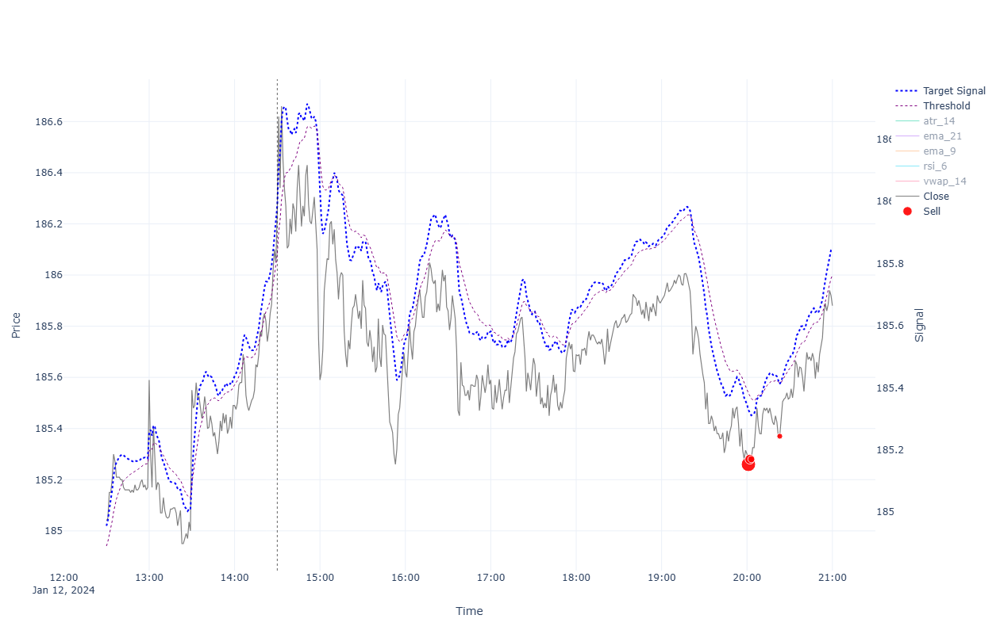


                                                  ******* Performance for 2024-01-12 *******

INTRADAY:
  shares(628); [ask_buy=186.287, fee_buy=0.004, pos_amnt_buy=116990.968]; [bid_sell=185.843, fee_sell=0.018, pos_amnt_sell=116697.823]; leftover=127.597; PNL=-293.145
TRADES:
  Tr[1]: Time(20:01)Ask(185.297)Bid(185.223)Act(Sell)Shrs(49)Pos(36); CashTr(9075.03)=Cost(9075.924)-Fee(-0.894); P&L(109999.826)=CashTot(103331.8)+PosAmt(6668.026)
  Tr[2]: Time(20:02)Ask(185.317)Bid(185.243)Act(Sell)Shrs(21)Pos(15); CashTr(3889.719)=Cost(3890.102)-Fee(-0.383); P&L(110000.162)=CashTot(107221.518)+PosAmt(2778.644)
  Tr[3]: Time(20:03)Ask(185.317)Bid(185.243)Act(Sell)Shrs(9)Pos(6); CashTr(1667.022)=Cost(1667.186)-Fee(-0.164); P&L(109999.998)=CashTot(108888.54)+PosAmt(1111.458)
  Tr[4]: Time(20:23)Ask(185.407)Bid(185.333)Act(Sell)Shrs(4)Pos(2); CashTr(741.259)=Cost(741.332)-Fee(-0.073); P&L(110000.465)=CashTot(109629.799)+PosAmt(370.666)
STRATEGY:
  Δ[1]:-38.287 + Δ[2]:0.337 + Δ[3]:-0.164 + Δ[4]:

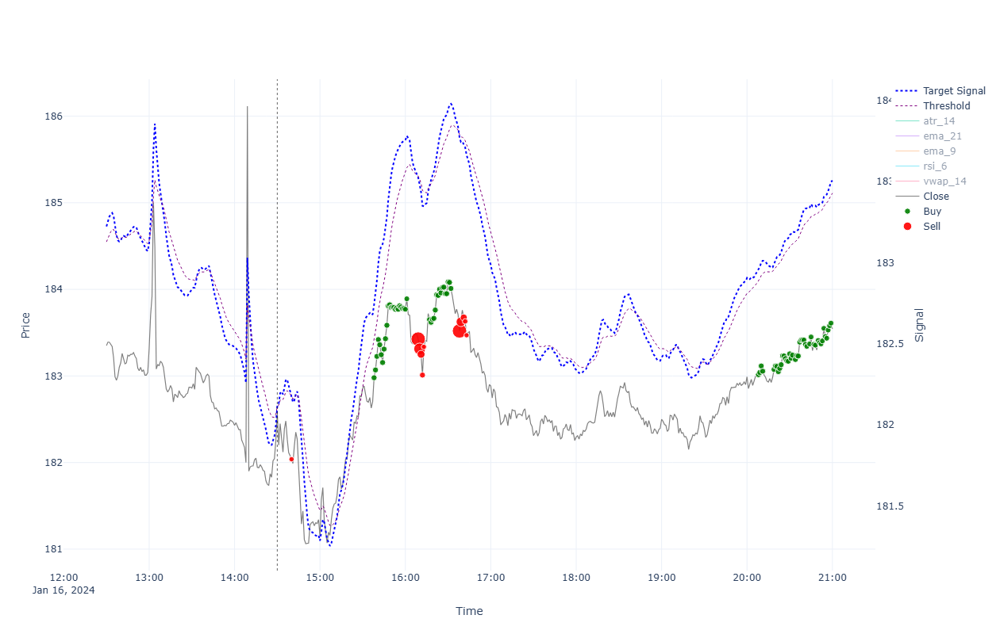


                                                  ******* Performance for 2024-01-16 *******

INTRADAY:
  shares(639); [ask_buy=182.617, fee_buy=0.004, pos_amnt_buy=116694.51]; [bid_sell=183.508, fee_sell=0.018, pos_amnt_sell=117250.161]; leftover=130.911; PNL=555.651
TRADES:
  Tr[1]: Time(14:40)Ask(182.075)Bid(182.002)Act(Sell)Shrs(2)Pos(0); CashTr(363.968)=Cost(364.004)-Fee(-0.036); P&L(109993.767)=CashTot(109993.767)+PosAmt(0.0)
  Tr[2]: Time(15:38)Ask(183.016)Bid(182.943)Act(Buy)Shrs(5)Pos(5); CashTr(-915.1)=Cost(-915.08)-Fee(-0.02); P&L(109993.381)=CashTot(109078.667)+PosAmt(914.714)
  Tr[3]: Time(15:39)Ask(183.106)Bid(183.032)Act(Buy)Shrs(5)Pos(10); CashTr(-915.548)=Cost(-915.528)-Fee(-0.02); P&L(109993.443)=CashTot(108163.119)+PosAmt(1830.324)
  Tr[4]: Time(15:40)Ask(183.263)Bid(183.189)Act(Buy)Shrs(5)Pos(15); CashTr(-916.333)=Cost(-916.313)-Fee(-0.02); P&L(109994.626)=CashTot(107246.785)+PosAmt(2747.84)
  Tr[5]: Time(15:41)Ask(183.457)Bid(183.383)Act(Buy)Shrs(5)Pos(20); CashTr

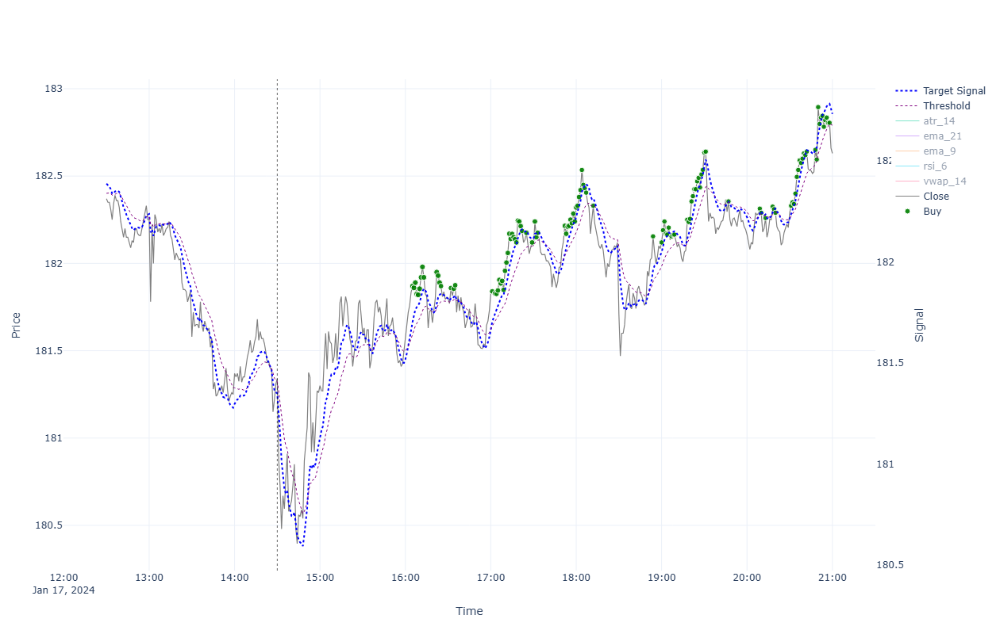


                                                  ******* Performance for 2024-01-17 *******

INTRADAY:
  shares(647); [ask_buy=181.376, fee_buy=0.004, pos_amnt_buy=117353.033]; [bid_sell=182.593, fee_sell=0.018, pos_amnt_sell=118126.208]; leftover=28.038; PNL=773.175
TRADES:
  Tr[1]: Time(16:05)Ask(181.906)Bid(181.834)Act(Buy)Shrs(4)Pos(189); CashTr(-727.641)=Cost(-727.625)-Fee(-0.016); P&L(109649.784)=CashTot(75283.229)+PosAmt(34366.555)
  Tr[2]: Time(16:06)Ask(181.896)Bid(181.824)Act(Buy)Shrs(4)Pos(193); CashTr(-727.601)=Cost(-727.585)-Fee(-0.016); P&L(109647.588)=CashTot(74555.627)+PosAmt(35091.96)
  Tr[3]: Time(16:07)Ask(181.926)Bid(181.854)Act(Buy)Shrs(4)Pos(197); CashTr(-727.722)=Cost(-727.706)-Fee(-0.016); P&L(109653.069)=CashTot(73827.906)+PosAmt(35825.164)
  Tr[4]: Time(16:08)Ask(181.861)Bid(181.789)Act(Buy)Shrs(4)Pos(201); CashTr(-727.461)=Cost(-727.445)-Fee(-0.016); P&L(109639.96)=CashTot(73100.444)+PosAmt(36539.516)
  Tr[5]: Time(16:09)Ask(181.856)Bid(181.784)Act(Buy)Shrs

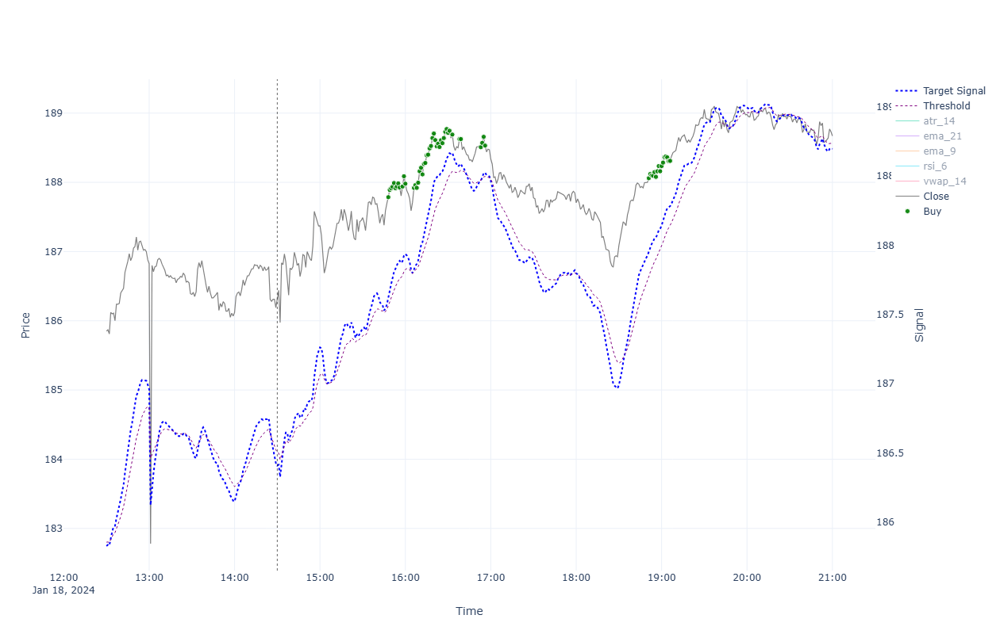


                                                  ******* Performance for 2024-01-18 *******

INTRADAY:
  shares(633); [ask_buy=186.367, fee_buy=0.004, pos_amnt_buy=117972.948]; [bid_sell=188.632, fee_sell=0.018, pos_amnt_sell=119392.622]; leftover=181.299; PNL=1419.674
TRADES:
  Tr[1]: Time(15:48)Ask(187.823)Bid(187.748)Act(Buy)Shrs(1)Pos(477); CashTr(-187.827)=Cost(-187.823)-Fee(-0.004); P&L(112344.222)=CashTot(22788.405)+PosAmt(89555.816)
  Tr[2]: Time(15:49)Ask(187.928)Bid(187.852)Act(Buy)Shrs(1)Pos(478); CashTr(-187.932)=Cost(-187.928)-Fee(-0.004); P&L(112393.931)=CashTot(22600.474)+PosAmt(89793.458)
  Tr[3]: Time(15:50)Ask(187.953)Bid(187.877)Act(Buy)Shrs(1)Pos(479); CashTr(-187.957)=Cost(-187.953)-Fee(-0.004); P&L(112405.8)=CashTot(22412.517)+PosAmt(89993.283)
  Tr[4]: Time(15:51)Ask(187.973)Bid(187.897)Act(Buy)Shrs(1)Pos(480); CashTr(-187.977)=Cost(-187.973)-Fee(-0.004); P&L(112415.299)=CashTot(22224.54)+PosAmt(90190.758)
  Tr[5]: Time(15:52)Ask(188.028)Bid(187.952)Act(Buy)Shr

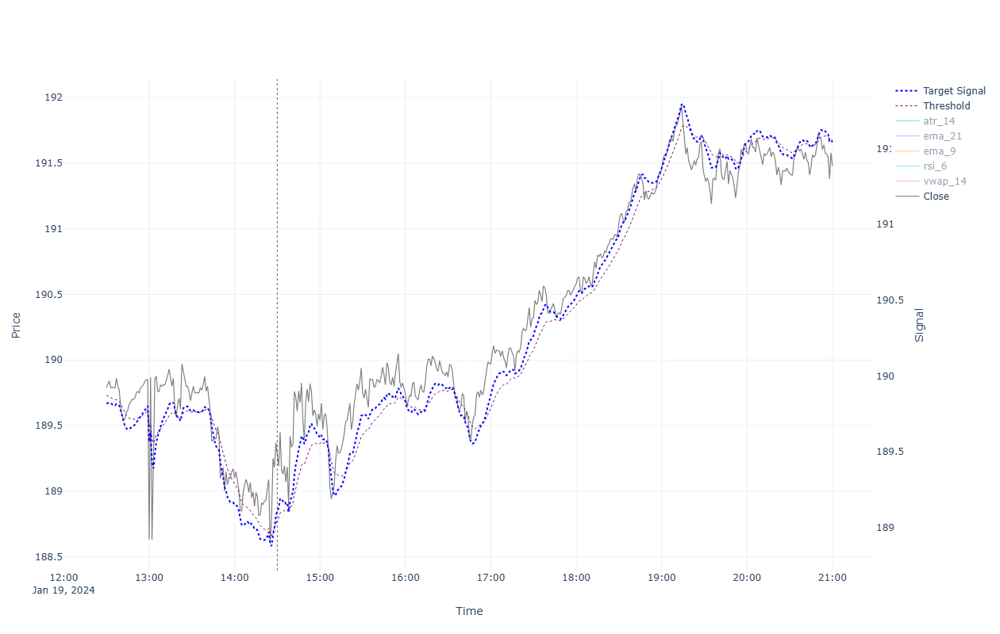


                                                  ******* Performance for 2024-01-19 *******

INTRADAY:
  shares(631); [ask_buy=189.308, fee_buy=0.004, pos_amnt_buy=119455.78]; [bid_sell=191.442, fee_sell=0.018, pos_amnt_sell=120788.109]; leftover=118.141; PNL=1332.329
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(754); [start=189.308 end=191.442]; leftover=66.975; total_cap=144400.152; PNL=2118.268

------------------------------------------------------------------------------------------------------------------------------------------------------



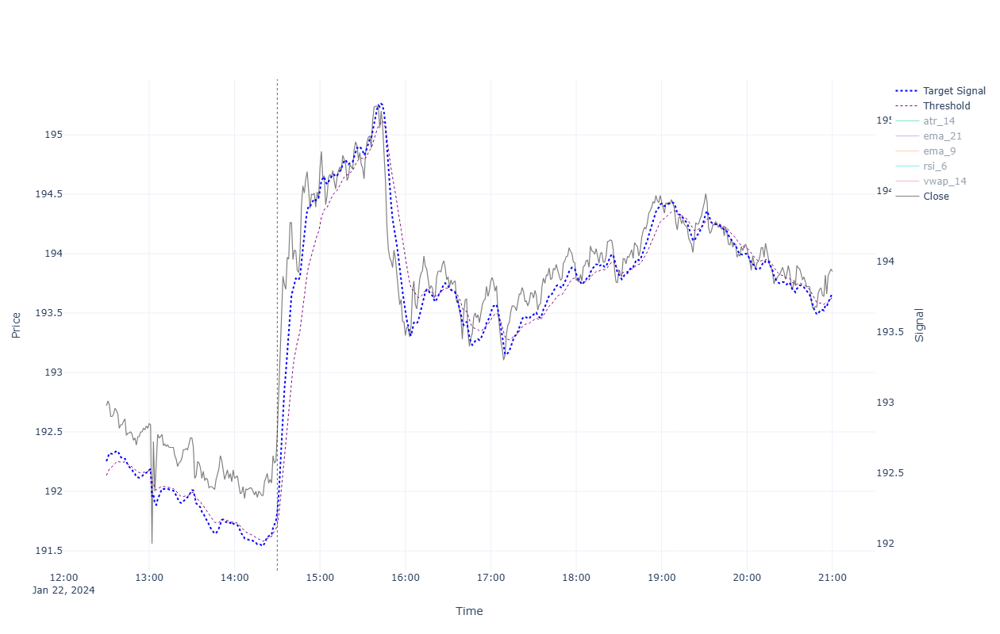


                                                  ******* Performance for 2024-01-22 *******

INTRADAY:
  shares(627); [ask_buy=192.528, fee_buy=0.004, pos_amnt_buy=120717.876]; [bid_sell=193.811, fee_sell=0.018, pos_amnt_sell=121508.075]; leftover=188.374; PNL=790.199
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(754); [start=192.528 end=193.811]; leftover=66.975; total_cap=146186.734; PNL=1786.582

------------------------------------------------------------------------------------------------------------------------------------------------------



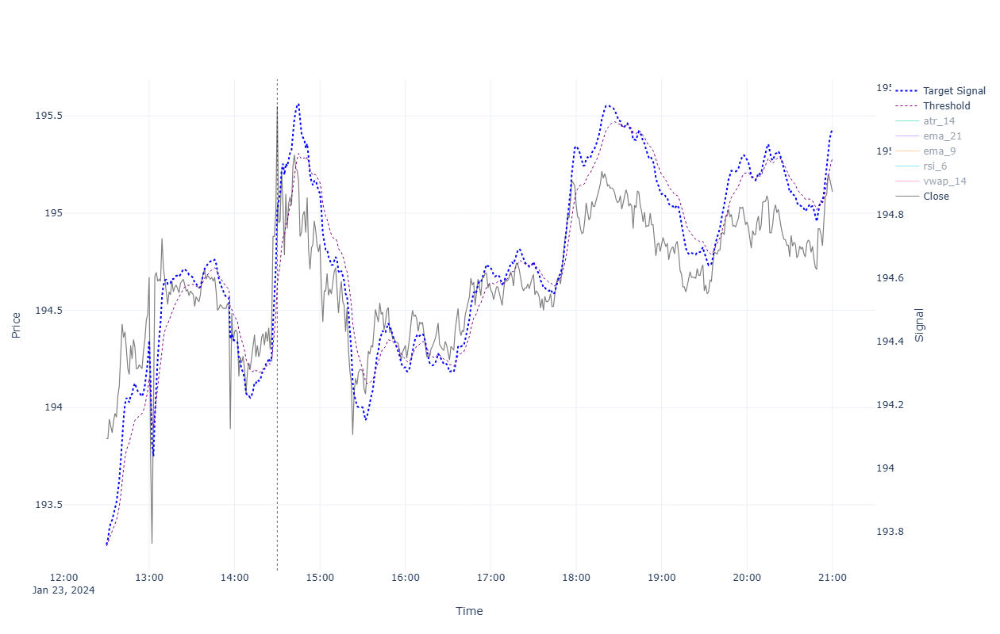


                                                  ******* Performance for 2024-01-23 *******

INTRADAY:
  shares(622); [ask_buy=195.589, fee_buy=0.004, pos_amnt_buy=121658.914]; [bid_sell=195.071, fee_sell=0.018, pos_amnt_sell=121322.656]; leftover=37.534; PNL=-336.258
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(754); [start=195.589 end=195.071]; leftover=66.975; total_cap=147136.562; PNL=949.828

------------------------------------------------------------------------------------------------------------------------------------------------------



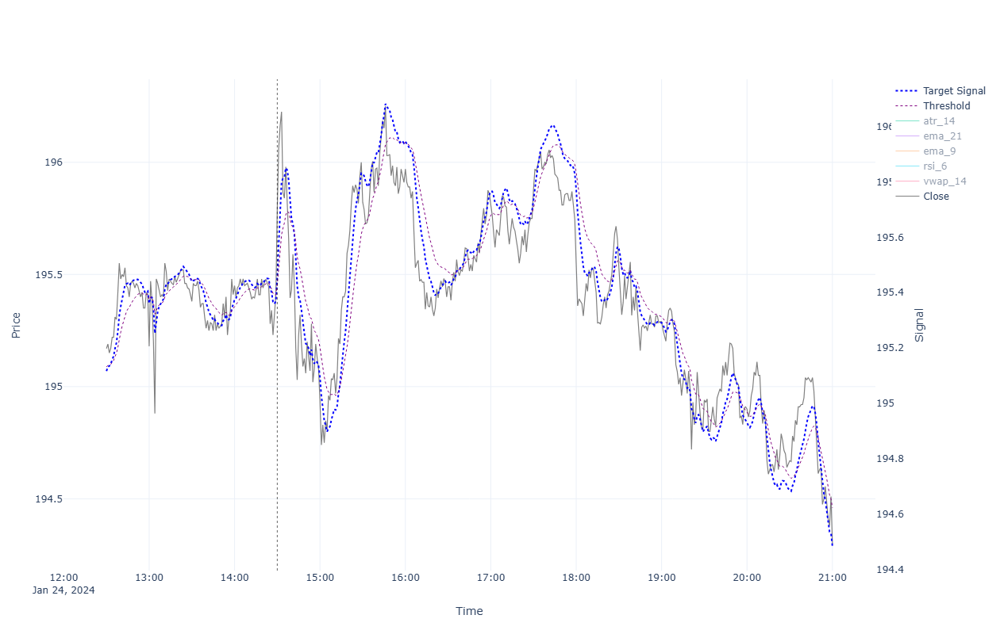


                                                  ******* Performance for 2024-01-24 *******

INTRADAY:
  shares(619); [ask_buy=195.831, fee_buy=0.004, pos_amnt_buy=121221.777]; [bid_sell=194.261, fee_sell=0.018, pos_amnt_sell=120236.22]; leftover=138.413; PNL=-985.557
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(754); [start=195.831 end=194.261]; leftover=66.975; total_cap=146525.958; PNL=-610.604

------------------------------------------------------------------------------------------------------------------------------------------------------



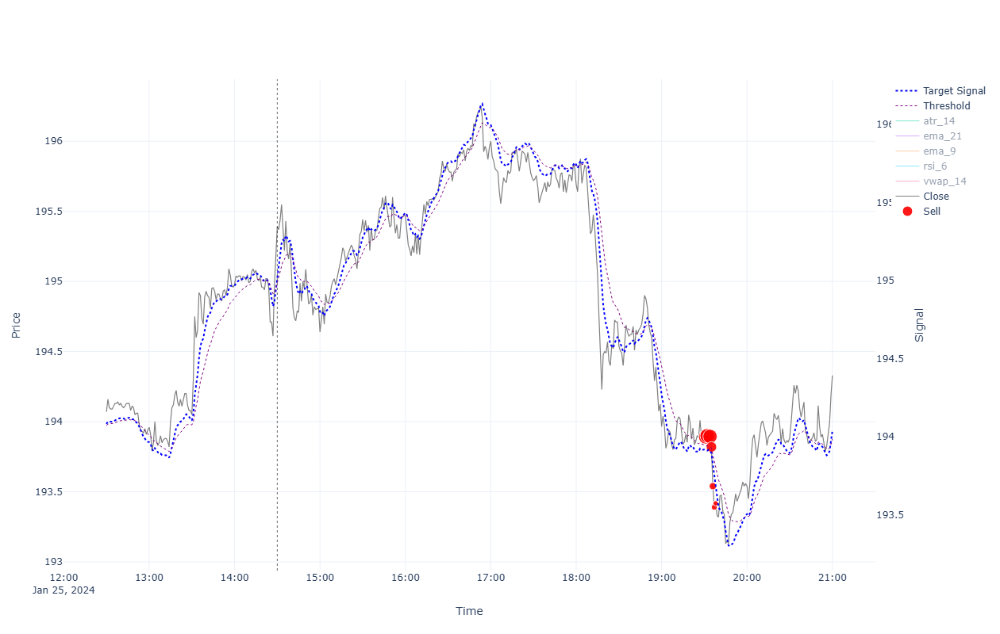


                                                  ******* Performance for 2024-01-25 *******

INTRADAY:
  shares(615); [ask_buy=195.429, fee_buy=0.004, pos_amnt_buy=120191.343]; [bid_sell=194.291, fee_sell=0.018, pos_amnt_sell=119477.696]; leftover=183.291; PNL=-713.647
TRADES:
  Tr[1]: Time(19:31)Ask(193.93)Bid(193.853)Act(Sell)Shrs(308)Pos(229); CashTr(59700.956)=Cost(59706.638)-Fee(-5.682); P&L(115581.082)=CashTot(71188.809)+PosAmt(44392.273)
  Tr[2]: Time(19:32)Ask(193.939)Bid(193.861)Act(Sell)Shrs(132)Pos(97); CashTr(25587.246)=Cost(25589.681)-Fee(-2.435); P&L(115580.593)=CashTot(96776.055)+PosAmt(18804.538)
  Tr[3]: Time(19:34)Ask(193.934)Bid(193.856)Act(Sell)Shrs(56)Pos(41); CashTr(10854.915)=Cost(10855.948)-Fee(-1.033); P&L(115579.075)=CashTot(107630.97)+PosAmt(7948.105)
  Tr[4]: Time(19:35)Ask(193.859)Bid(193.781)Act(Sell)Shrs(24)Pos(17); CashTr(4650.307)=Cost(4650.75)-Fee(-0.443); P&L(115575.558)=CashTot(112281.277)+PosAmt(3294.281)
  Tr[5]: Time(19:36)Ask(193.579)Bid(193.50

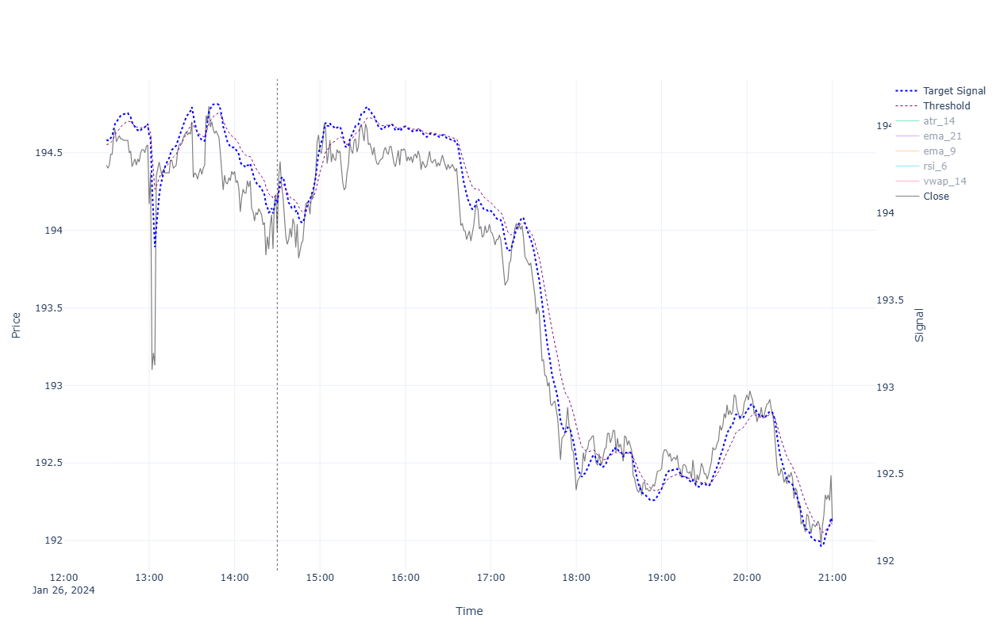


                                                  ******* Performance for 2024-01-26 *******

INTRADAY:
  shares(616); [ask_buy=194.029, fee_buy=0.004, pos_amnt_buy=119524.204]; [bid_sell=192.082, fee_sell=0.018, pos_amnt_sell=118310.912]; leftover=136.783; PNL=-1213.292
TRADES:

STRATEGY:
   PNL=0.0
BUYNHOLD:
  shares(754); [start=194.029 end=192.082]; leftover=66.975; total_cap=144882.604; PNL=-1665.969

------------------------------------------------------------------------------------------------------------------------------------------------------



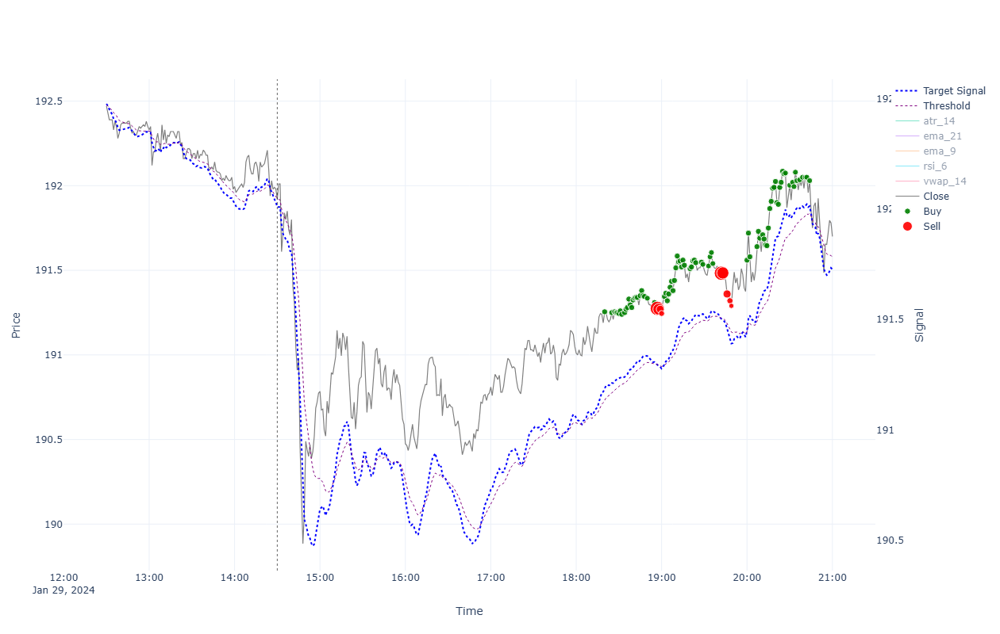


                                                  ******* Performance for 2024-01-29 *******

INTRADAY:
  shares(617); [ask_buy=191.958, fee_buy=0.004, pos_amnt_buy=118440.791]; [bid_sell=191.662, fee_sell=0.018, pos_amnt_sell=118243.893]; leftover=6.903; PNL=-196.898
TRADES:
  Tr[1]: Time(18:20)Ask(191.293)Bid(191.217)Act(Buy)Shrs(5)Pos(5); CashTr(-956.486)=Cost(-956.466)-Fee(-0.02); P&L(115569.088)=CashTot(114613.005)+PosAmt(956.083)
  Tr[2]: Time(18:25)Ask(191.288)Bid(191.212)Act(Buy)Shrs(5)Pos(10); CashTr(-956.461)=Cost(-956.441)-Fee(-0.02); P&L(115568.661)=CashTot(113656.543)+PosAmt(1912.117)
  Tr[3]: Time(18:27)Ask(191.293)Bid(191.217)Act(Buy)Shrs(5)Pos(15); CashTr(-956.486)=Cost(-956.466)-Fee(-0.02); P&L(115568.308)=CashTot(112700.057)+PosAmt(2868.251)
  Tr[4]: Time(18:28)Ask(191.288)Bid(191.212)Act(Buy)Shrs(5)Pos(20); CashTr(-956.461)=Cost(-956.441)-Fee(-0.02); P&L(115567.831)=CashTot(111743.596)+PosAmt(3824.235)
  Tr[5]: Time(18:29)Ask(191.288)Bid(191.212)Act(Buy)Shrs(5)Pos(2

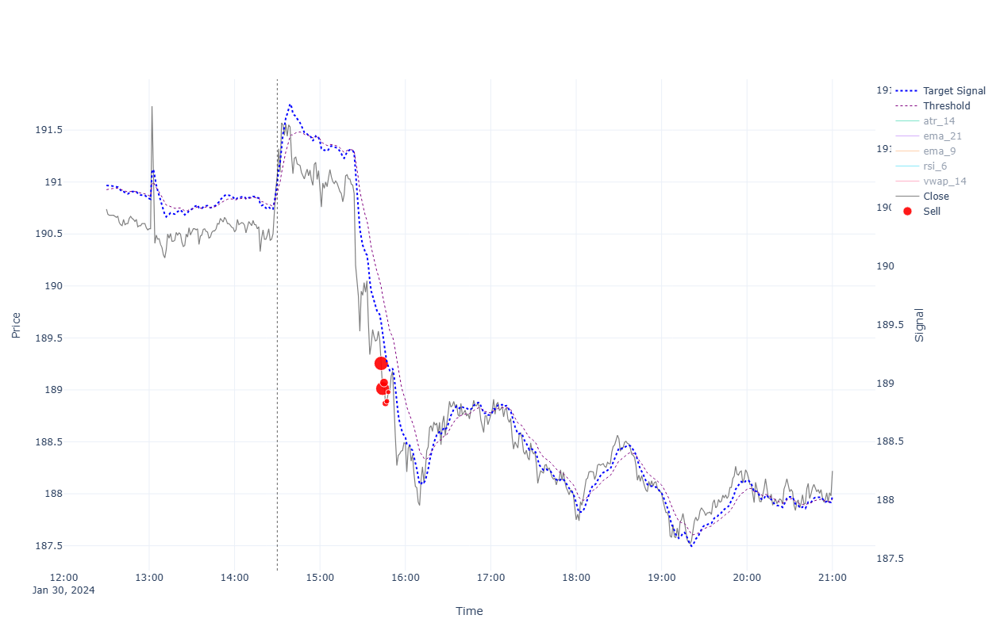


                                                  ******* Performance for 2024-01-30 *******

INTRADAY:
  shares(618); [ask_buy=191.098, fee_buy=0.004, pos_amnt_buy=118101.167]; [bid_sell=188.182, fee_sell=0.018, pos_amnt_sell=116285.375]; leftover=149.629; PNL=-1815.792
TRADES:
  Tr[1]: Time(15:43)Ask(189.293)Bid(189.217)Act(Sell)Shrs(89)Pos(65); CashTr(16838.694)=Cost(16840.326)-Fee(-1.632); P&L(115120.779)=CashTot(102821.664)+PosAmt(12299.115)
  Tr[2]: Time(15:44)Ask(189.051)Bid(188.975)Act(Sell)Shrs(38)Pos(27); CashTr(7180.349)=Cost(7181.046)-Fee(-0.697); P&L(115104.336)=CashTot(110002.014)+PosAmt(5102.322)
  Tr[3]: Time(15:45)Ask(189.108)Bid(189.032)Act(Sell)Shrs(16)Pos(11); CashTr(3024.222)=Cost(3024.515)-Fee(-0.293); P&L(115105.589)=CashTot(113026.235)+PosAmt(2079.354)
  Tr[4]: Time(15:46)Ask(188.908)Bid(188.832)Act(Sell)Shrs(7)Pos(4); CashTr(1321.697)=Cost(1321.826)-Fee(-0.128); P&L(115103.261)=CashTot(114347.933)+PosAmt(755.329)
  Tr[5]: Time(15:47)Ask(188.928)Bid(188.852)Act

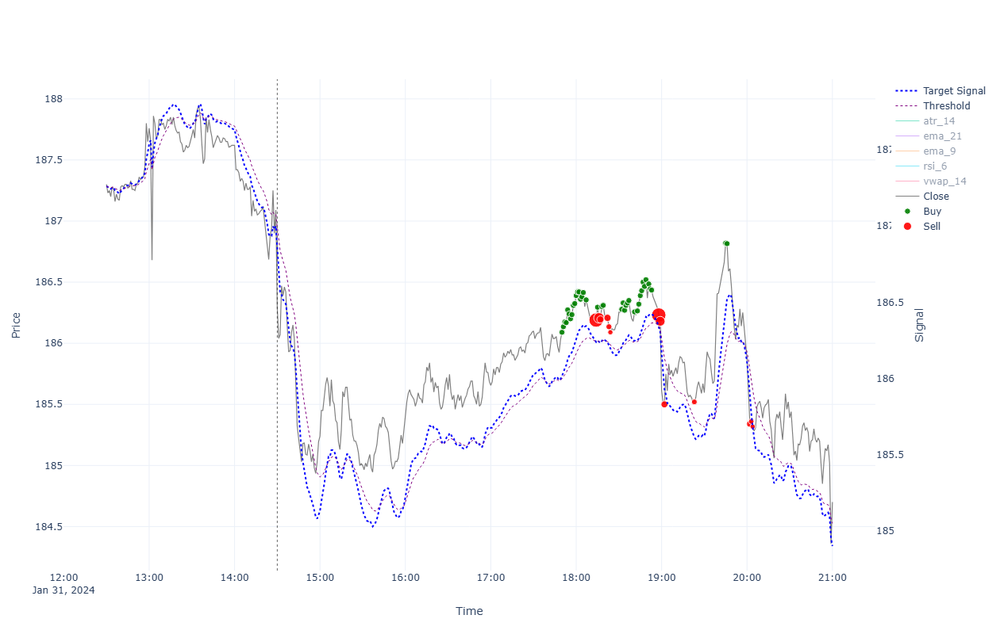


                                                  ******* Performance for 2024-01-31 *******

INTRADAY:
  shares(624); [ask_buy=186.327, fee_buy=0.004, pos_amnt_buy=116270.705]; [bid_sell=184.663, fee_sell=0.018, pos_amnt_sell=115218.369]; leftover=164.299; PNL=-1052.336
TRADES:
  Tr[1]: Time(17:50)Ask(186.127)Bid(186.053)Act(Buy)Shrs(5)Pos(5); CashTr(-930.656)=Cost(-930.636)-Fee(-0.02); P&L(115102.964)=CashTot(114172.701)+PosAmt(930.263)
  Tr[2]: Time(17:51)Ask(186.172)Bid(186.098)Act(Buy)Shrs(5)Pos(10); CashTr(-930.881)=Cost(-930.861)-Fee(-0.02); P&L(115102.797)=CashTot(113241.819)+PosAmt(1860.978)
  Tr[3]: Time(17:52)Ask(186.212)Bid(186.138)Act(Buy)Shrs(5)Pos(15); CashTr(-931.081)=Cost(-931.061)-Fee(-0.02); P&L(115102.805)=CashTot(112310.738)+PosAmt(2792.066)
  Tr[4]: Time(17:53)Ask(186.206)Bid(186.132)Act(Buy)Shrs(5)Pos(20); CashTr(-931.051)=Cost(-931.031)-Fee(-0.02); P&L(115102.321)=CashTot(111379.688)+PosAmt(3722.633)
  Tr[5]: Time(17:54)Ask(186.31)Bid(186.236)Act(Buy)Shrs(5)Pos

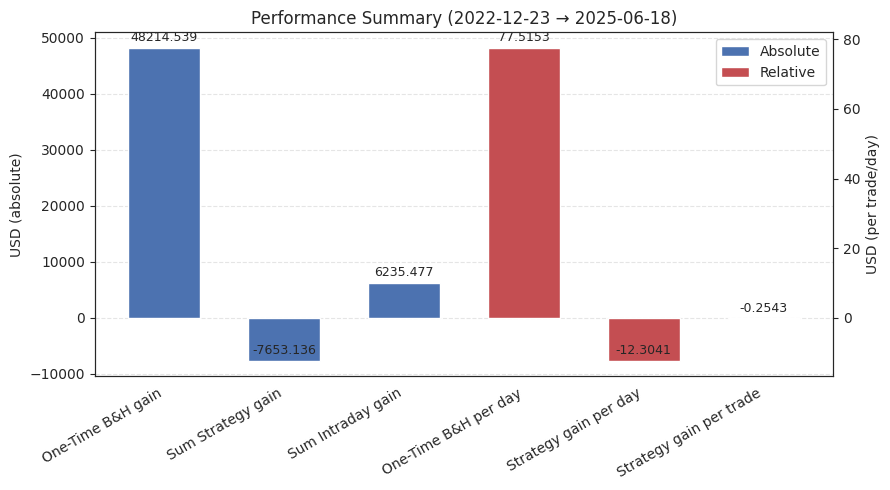

Rolling monthly summary (each metric carries its own capital forward):

Monthly Summary 2022-12 (2022-12-23 = 132.533 → 2022-12-30 = 129.814)
Num. trading days: 5  Trades Count: 271
One-Time B&H gain: -2066.049 | start: 100000.000 | final: 97933.951 | PnL%: -2.07%
Sum Strategy gain: -1036.114 | start: 100000.000 | final: 98963.886 | PnL%: -1.04%
Sum Intraday gain: -1097.078 | start: 100000.000 | final: 98902.922 | PnL%: -1.10%

Monthly Summary 2023-01 (2023-01-03 = 129.814 → 2023-01-31 = 144.151)
Num. trading days: 20  Trades Count: 1543
One-Time B&H gain: 10809.949 | start: 97933.951 | final: 108743.900 | PnL%: 11.04%
Sum Strategy gain: 2467.573 | start: 98963.886 | final: 101431.459 | PnL%: 2.49%
Sum Intraday gain: 9380.434 | start: 98902.922 | final: 108283.356 | PnL%: 9.48%

Monthly Summary 2023-02 (2023-02-01 = 144.151 → 2023-02-28 = 147.361)
Num. trading days: 19  Trades Count: 1010
One-Time B&H gain: 2419.801 | start: 108743.900 | final: 111163.701 | PnL%: 2.23%
Sum Strategy gai

In [6]:
# importlib.reload(params) ######
# importlib.reload(strategies) ######

year, month = map(int, params.month_to_check.split("-"))
dates_in_month = [date for date in sim_results if date.year == year and date.month == month]

if not dates_in_month:
    print(f"No simulation data for {params.month_to_check}")
else:
    for date in sorted(dates_in_month):
        df_at_date_plot, trades_at_date, stats_at_date = sim_results[date]
        plots.plot_trades(
            df                 = df_at_date_plot,
            col_signal1        = col_signal,
            sign_thresh        = sign_thresh, 
            axis_sig_thresh    = 'second',
            trades             = trades_at_date,
            performance_stats  = stats_at_date,
            features           = ['ema_9','ema_21','rsi_6', 'atr_14', 'vwap_14', 'rsi_thresh'],
            start_plot         = params.sess_start_shift,
            autoscale          = False
        )
        
        print(f"\n{' ' * 50}******* Performance for {date.strftime('%Y-%m-%d')} *******\n")
        for k,v in stats_at_date.items(): # Print stats dict for each date nicely
            print(f"{k}:\n" + "\n".join("  "+L for L in (v if isinstance(v,list) else str(v).splitlines())))
        print("\n" + "-"*150 + "\n")

# final visualizations and monthly aggregations
strategies.aggregate_performance(df = df_inds_test,
                                 sim_results = sim_results,
                                 sess_start = sess_start)
